# Importação e Limpeza

In [35]:
import pandas as pd
import plotly.express as px
import inflection
import numpy as np
import folium
from folium.plugins import MarkerCluster
from PIL import Image
from streamlit_folium import folium_static

df = pd.read_csv('zomato.csv')

#Limpeza de dados
df1 = df.copy()

#Renomear as colunas do DataFrame
def rename_columns(dataframe):
    df1 = dataframe.copy()
    title = lambda x: inflection.titleize(x)
    snakecase = lambda x: inflection.underscore(x)
    spaces = lambda x: x.replace(" ", "")
    cols_old = list(df1.columns)
    cols_old = list(map(title, cols_old))
    cols_old = list(map(spaces, cols_old))
    cols_new = list(map(snakecase, cols_old))
    df1.columns = cols_new
    return df1
df1 = rename_columns(df1)

countries = {
    1: 'India',
    14: 'Australia', 
    30: 'Brazil', 
    37: 'Canada', 
    94: 'Indonesia', 
    148: 'New Zeland', 
    162: 'Philippines', 
    166: 'Qatar', 
    184: 'Singapure', 
    189: 'South Africa', 
    191: 'Sri Lanka', 
    208: 'Turkey', 
    214: 'United Arab Emirates',
    215: 'England', 
    216: 'United States of America' 
}

def country_name(country_code):
    return countries[country_code]

df1['country_code'] = df1['country_code'].apply(country_name)

#Criação do Tipo de Categoria de Comida

def create_price_type(price_range):
    if price_range == 1:
        return "cheap"
    elif price_range == 2:
        return "normal"
    elif price_range == 3:
        return "expensive"
    else:
        return "gourmet"

df1["price_range_description"] = df1["price_range"].apply(create_price_type)
    
#Criação do nome das Cores

COLORS = {
    "3F7E00": "darkgreen",
    "5BA829": "green",
    "9ACD32": "lightgreen",
    "CDD614": "orange",
    "FFBA00": "red",
    "CBCBC8": "darkred",
    "FF7800": "darkred",
}

def color_name(color_code):
    return COLORS[color_code]

df1['color_name'] = df1['rating_color'].apply(color_name)


df1.drop('switch_to_order_menu', axis=1, inplace=True)
df1 = df1.dropna()
df1["cuisines"] = df1.loc[:, "cuisines"].apply(lambda x: x.split(",")[0])
df1 = df1.drop_duplicates().reset_index()

# Geral

1. Quantos restaurantes únicos estão registrados?

In [37]:
df1['restaurant_id'].nunique()

6929

2. Quantos países únicos estão registrados?


In [44]:
df1['country_code'].nunique()

15

3. Quantas cidades únicas estão registradas?



In [43]:
df1['city'].nunique()

125

4. Qual o total de avaliações feitas?


In [47]:
df1['votes'].sum()

4194533

5. Qual o total de tipos de culinária registrados?

In [101]:
df1.loc[:, 'cuisines'].nunique()

165

# Pais

1. Qual o nome do país que possui mais cidades registradas?

In [ ]:
(df2.loc[:, ['city', 'country_code'] ].groupby('v')
                                         .nunique()
                                         .sort_values('city', ascending=False)
                                         .reset_index()).iloc[0, 0]

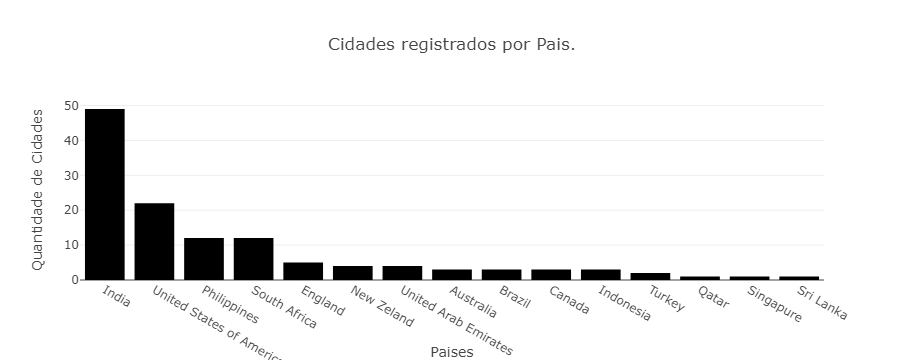

In [46]:
i = ['city', 'country_code']

grafico = df1.loc[:,i].groupby(['country_code']).nunique().reset_index().sort_values('city',ascending=False)

fig = px.bar(grafico, x= 'country_code', y= 'city', title= 'Cidades registrados por Pais.', labels={
            "country_code": "Paises",
            "city": "Quantidade de Cidades",
        })
fig

2. Qual o nome do país que possui mais restaurantes registrados?

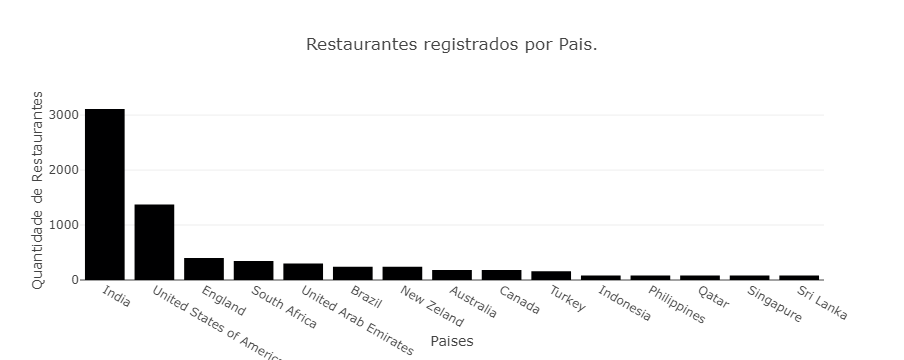

In [47]:
i = ['country_code', 'restaurant_id']

grafico = df1.loc[:,i].groupby(['country_code']).count().reset_index().sort_values('restaurant_id',ascending=False)

fig = px.bar(grafico, x= 'country_code', y= 'restaurant_id', title= 'Restaurantes registrados por Pais.', labels={
            "country_code": "Paises",
            "restaurant_id": "Quantidade de Restaurantes",
        })
fig
#st.plotly_chart (fig, use_countainer=True)

3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4
registrados?

In [104]:
(df1.loc[df1['aggregate_rating'] >= 4, ['country_code', 'restaurant_id'] ].groupby('country_code').count()
                                                                          .sort_values('restaurant_id', ascending=False)
                                                                          .reset_index().iloc[0, 0])


'India'

4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?

In [105]:
i = ['country_code', 'cuisines']

df1.loc[:,i].groupby(['country_code']).nunique().reset_index().sort_values('cuisines',ascending=False).iloc[0, 0]

'India'

5. Qual o nome do país que possui a maior quantidade de avaliações feitas?

In [106]:
i = ['country_code', 'aggregate_rating']

df1.loc[:,i].groupby(['country_code']).count().reset_index().sort_values('aggregate_rating',ascending=False).iloc[0, 0]

'India'

6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem
entrega?

In [107]:
(df1.loc[df1['has_table_booking'] == 1, ['country_code', 'restaurant_id'] ].groupby('country_code').count()
                                                                          .sort_values('restaurant_id', ascending=False)
                                                                          .reset_index().iloc[0, 0])


'India'

7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam
reservas?

In [108]:
(df1.loc[df1['has_online_delivery'] == 1, ['country_code', 'restaurant_id'] ].groupby('country_code').count()
                                                                          .sort_values('restaurant_id', ascending=False)
                                                                          .reset_index().iloc[0, 0])

'India'

8. Qual o nome do país que possui, na média, a maior quantidade de avaliações
registrada?

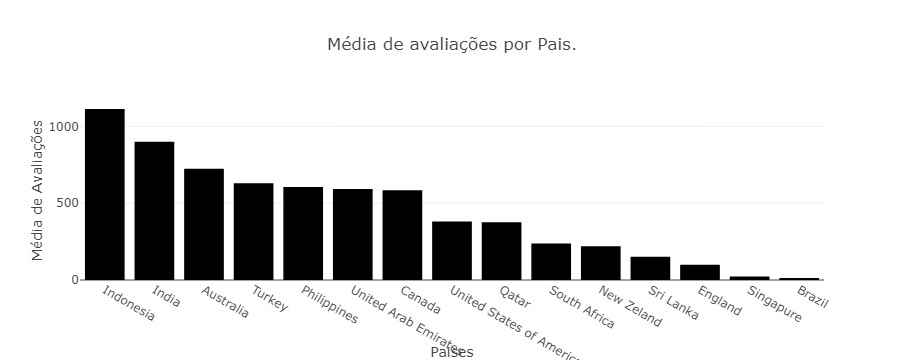

In [48]:
i = ['country_code', 'votes']

grafico = df1.loc[:,i].groupby(['country_code']).mean().reset_index().sort_values('votes',ascending=False)

fig = px.bar(grafico, x= 'country_code', y= 'votes', title= 'Média de avaliações por Pais.', labels={
            "country_code": "Paises",
            "votes": "Média de Avaliações",
        })
fig

9. Qual o nome do país que possui, na média, a maior nota média registrada?

In [109]:
i = ['country_code', 'aggregate_rating']

df1.loc[:,i].groupby(['country_code']).mean().reset_index().sort_values('aggregate_rating',ascending=False).iloc[0, 0]

'Indonesia'

10. Qual o nome do país que possui, na média, a menor nota média registrada?


In [29]:
i = ['country_code', 'aggregate_rating']

df1.loc[:,i].groupby(['country_code']).mean().reset_index().sort_values('aggregate_rating',ascending=True).iloc[0, 0]

'Brazil'

11. Qual a média de preço de um prato para dois por país?

In [111]:
i = ['country_code', 'average_cost_for_two']

gragico = df1.loc[:,i].groupby(['country_code']).mean().reset_index().sort_values('average_cost_for_two',ascending=False)

fig = px.bar(grafico, x= 'country_code', y= 'average_cost_for_two', title= 'Média de preço de prato para dois.', labels={
            "country_code": "Paises",
            "votaverage_cost_for_twoes": "Média de preço de prato para dois",
        })
fig

'Indonesia'

# Cidade

1. Qual o nome da cidade que possui mais restaurantes registrados?

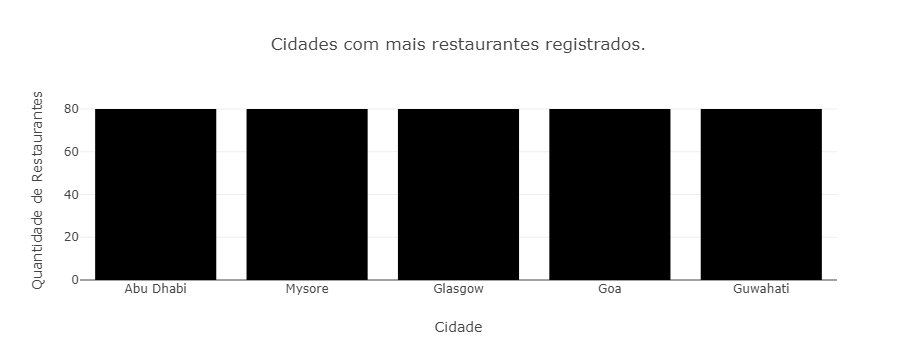

In [19]:
grafico = (df1.loc[:, ['city','restaurant_id']].groupby(['city'])
                                         .nunique()
                                         .reset_index()
                                         .sort_values('restaurant_id', ascending = False))
fig = px.bar(grafico.head(5), x= 'city', y= 'restaurant_id', title= 'Cidades com mais restaurantes registrados.', labels={
            "city": "Cidade",
            "restaurant_id": "Quantidade de Restaurantes",
        })

fig

2. Qual o nome da cidade que possui mais restaurantes com nota média acima de
4?

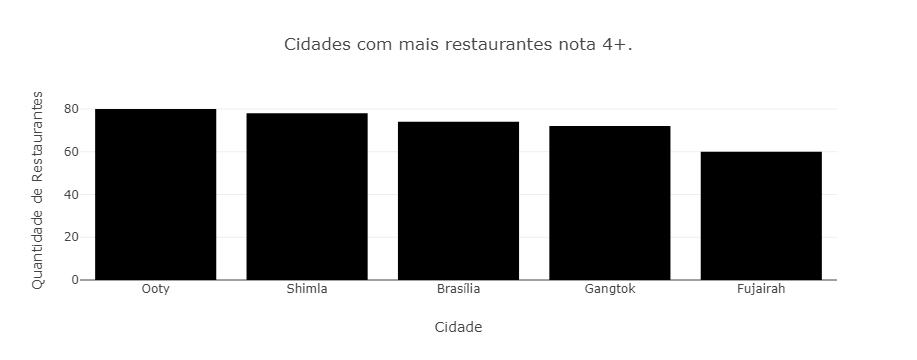

In [3]:
grafico = (df1.loc[df1['aggregate_rating'] <= 4, ['city','restaurant_id','country_code']].groupby(['city'])
                                                                   .count().reset_index()
                                                                   .sort_values(['country_code','restaurant_id'], ascending = False))
fig = px.bar(grafico.head(5), x= 'city', y = 'restaurant_id', title= 'Cidades com mais restaurantes nota 4+.', labels={
            "city": "Cidade",
            "restaurant_id": "Quantidade de Restaurantes",
            'country_code' : 'Países'
        })
fig



3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de
2.5?

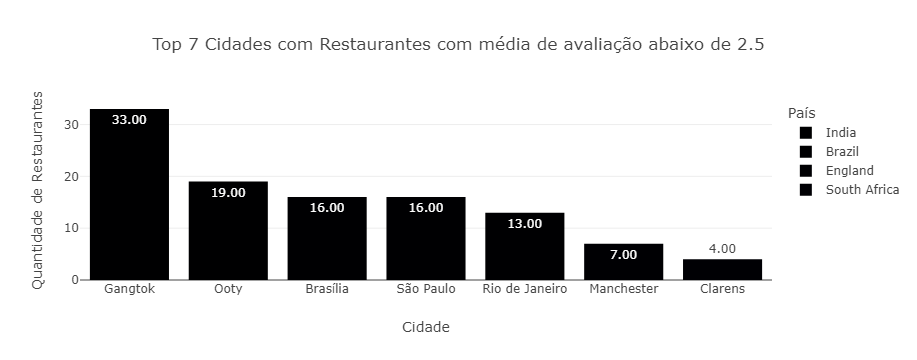

In [2]:
grafico = (df1.loc[df1['aggregate_rating'] <= 2.5, ["restaurant_id", "country_code", "city"],
        ]
        .groupby(["country_code", "city"])
        .count()
        .sort_values(["restaurant_id", "city"], ascending=[False,True])
        .reset_index()
    )

fig = px.bar(
        grafico.head(7),
        x="city",
        y="restaurant_id",
        text="restaurant_id",
        text_auto=".2f",
        color = 'country_code',
        title="Top 7 Cidades com Restaurantes com média de avaliação abaixo de 2.5",
        labels={
            "city": "Cidade",
            "restaurant_id": "Quantidade de Restaurantes",
            "country_code": "País",
        },
    )
fig

4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?

In [135]:
i = (df1.loc[:, ['city','average_cost_for_two']].groupby(['city'])
                                            .mean().reset_index()
                                            .sort_values('average_cost_for_two', ascending = False).iloc[0,0])
i

'Adelaide'

5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária
distintas?

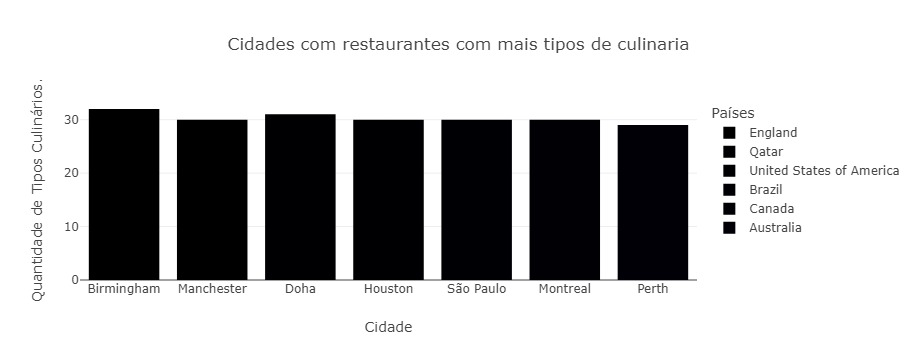

In [4]:
grafico = (df1.loc[:, ['city', 'country_code','cuisines']].groupby(['country_code','city'])
                                            .nunique().reset_index()
                                            .sort_values('cuisines', ascending = False))

fig = px.bar(grafico.head(7), x= 'city', y = 'cuisines',color = 'country_code', title= 'Cidades com restaurantes com mais tipos de culinaria', labels={
            "city": "Cidade",
            "cuisines": "Quantidade de Tipos Culinários.",
            'country_code' : 'Países'
        })
fig

6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem
reservas?

In [141]:
i = (df1.loc[df1['has_table_booking'] == 1 , ['city','restaurant_id']].groupby(['city'])
                                            .count().reset_index()
                                            .sort_values('restaurant_id', ascending = False).iloc[0,0])
i

'Bangalore'

7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem
entregas?

In [144]:
i = (df1.loc[df1['is_delivering_now'] == 1 , ['city','restaurant_id']].groupby(['city'])
                                            .count().reset_index()
                                            .sort_values('restaurant_id', ascending = False).iloc[0,0])
i

'Vadodara'

8. Qual o nome da cidade que possui a maior quantidade de restaurantes que
aceitam pedidos online?

In [145]:
i = (df1.loc[df1['has_online_delivery'] == 1 , ['city','restaurant_id']].groupby(['city'])
                                            .count().reset_index()
                                            .sort_values('restaurant_id', ascending = False).iloc[0,0])
i

'Bhopal'

# Restaurantes

1. Qual o nome do restaurante que possui a maior quantidade de avaliações?

In [77]:
i= (df1.loc[:, ['restaurant_id','restaurant_name','aggregate_rating']].groupby(['restaurant_name'])
                                            .count().reset_index()
                                            .sort_values(['aggregate_rating','restaurant_id'], ascending = False).iloc[0,0])
i

"Domino's Pizza"

2. Qual o nome do restaurante com a maior nota média?

In [83]:
i = df1.loc[:,['restaurant_id', 'restaurant_name', 'aggregate_rating']].sort_values(['aggregate_rating', 'restaurant_id'], ascending=False).iloc[0,1]

i

'Baithak'

3. Qual o nome do restaurante que possui o maior valor de uma prato para duas
pessoas?

In [79]:
i = (df1.loc[:, ['city', 'country_code','cuisines','restaurant_name','average_cost_for_two']].groupby(['restaurant_name'])
                                                           .max().reset_index()
                                                           .sort_values('average_cost_for_two', ascending = False).iloc[0,0])
i

"d'Arry's Verandah Restaurant"

4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor
média de avaliação?

In [80]:
i = (df1.loc[df1['cuisines'] == 'Brazilian' , ['aggregate_rating','restaurant_name']].groupby(['restaurant_name'])
                                            .count().reset_index()
                                            .sort_values('aggregate_rating', ascending = True).iloc[0,0])
i

'Academia da Cachaça'

5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que
possui a maior média de avaliação?

In [81]:
i = (df1.loc[(df1['cuisines'] == 'Brazilian') & (df1['country_code'] == 'Brazil'), ['aggregate_rating','restaurant_name','restaurant_id']].groupby(['restaurant_name'])
                                            .mean().reset_index()
                                            .sort_values(['aggregate_rating', 'restaurant_id'], ascending = False).iloc[0,0])
i

'Aprazível'

6. Os restaurantes que aceitam pedido online são também, na média, os
restaurantes que mais possuem avaliações registradas?

In [106]:
i = (df1.loc[:, ['has_online_delivery', 'votes']].groupby(['has_online_delivery']).mean().sort_values(['votes'], ascending = False).reset_index())
             
i

,has_online_delivery,votes
0,1,838.821664
1,0,479.421018


7. Os restaurantes que fazem reservas são também, na média, os restaurantes que
possuem o maior valor médio de um prato para duas pessoas?

In [107]:
i = (df1.loc[:, ['has_table_booking', 'average_cost_for_two']].groupby(['has_table_booking']).mean().sort_values(['average_cost_for_two'], ascending = False).reset_index())
             
i

,has_table_booking,average_cost_for_two
0,1,69998.423810
1,0,3488.596866


8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América
possuem um valor médio de prato para duas pessoas maior que as churrascarias
americanas (BBQ)?

In [164]:
i = (df1.loc[ (df1['country_code'] == 'United States of America') & ((df1['cuisines'] == 'Japanese') | (df1['cuisines'] == 'BBQ')), ['average_cost_for_two','cuisines' ]]
                                            .groupby(['cuisines'])
                                            .mean().reset_index()
                                            .sort_values(['average_cost_for_two'], ascending = False))
i

,cuisines,average_cost_for_two
1,Japanese,56.406250
0,BBQ,39.642857


In [162]:
lines = (df1['country_code'] == 'United States of America') & ((df1['cuisines'] == 'BBQ') | (df1['cuisines'] == 'Japanese'))

(df1.loc[lines, ['average_cost_for_two', 'cuisines'] ]
                                         .groupby('cuisines')
                                         .mean()
                                         .sort_values('average_cost_for_two', ascending=False)
                                         .reset_index())

,cuisines,average_cost_for_two
0,Japanese,56.406250
1,BBQ,39.642857


# Tipos de Culinária

1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do
restaurante com a maior média de avaliação?

In [5]:
i = (df1.loc[(df1['cuisines'] == 'Italian') , [ 'aggregate_rating', 'restaurant_name', 'restaurant_id', 'votes']]
     .sort_values(['aggregate_rating','votes'], ascending = False))

i

,aggregate_rating,restaurant_name,restaurant_id,votes
4995,4.9,Darshan,10021,3106
3796,4.9,Zolocrust - Hotel Clarks Amer,18209498,1127
1348,4.9,Central Grocery,17242351,1079
337,4.9,Andre's Cucina & Polenta Bar,16587684,840
1192,4.9,Bottega Louie,16831684,751
...,...,...,...,...
278,0.0,Ristorantino,6714499,2
170,0.0,La Bocca Bar e Trattoria,18334183,1
138,0.0,Avenida Paulista,6600542,0
6218,0.0,Veeno,18756659,0


2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do
restaurante com a menor média de avaliação?

In [27]:
i = (df1.loc[(df1['cuisines'] == 'Italian') , [ 'aggregate_rating', 'restaurant_name', 'restaurant_id', 'votes']]
     .sort_values(['aggregate_rating','votes'], ascending = True).iloc[0,1])

i

'Avenida Paulista'

3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do
restaurante com a maior média de avaliação?

In [28]:
i = (df1.loc[(df1['cuisines'] == 'American') , [ 'aggregate_rating','votes', 'restaurant_name', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = False))
i

,aggregate_rating,votes,restaurant_name,restaurant_id
1419,4.9,1633,Shake Shack,16777384
694,4.9,1477,OEB Breakfast Co.,16631515
1802,4.9,1262,The Magnolia Pancake Haus,17153940
790,4.9,1025,Portillo's Hot Dogs,16737455
393,4.9,836,Brick Store Pub,16896981
...,...,...,...,...
5850,3.2,123,Thunderbird Cafe,7100971
6677,2.8,576,Hard Rock Cafe,6502573
228,2.6,2,Bob's,7303748
6625,2.2,183,Guy Fieri's Kitchen & Bar,18445965


4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do
restaurante com a menor média de avaliação?

In [24]:
i = (df1.loc[(df1['cuisines'] == 'American') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = True).iloc[0,0]
    )

i

5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do
restaurante com a maior média de avaliação?

In [29]:
i = (df1.loc[(df1['cuisines'] == 'Arabian') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = False))

i


,restaurant_name,aggregate_rating,votes,restaurant_id
3647,Mandi@36,4.7,1085,18535007
6336,Wok of Fame,4.5,978,6200166
3031,Three Kings,4.5,333,18770281
2375,Madfoon Al Khaimah,4.5,305,5600517
2235,Aroos Damascus,4.4,2006,201824
2414,Aroos Damascus,4.4,1036,5601340
2276,Azkadenya,4.3,660,209723
2180,Azkadenya,4.3,318,18427358
2282,Awani,4.2,680,207265
3632,Marsala Food Company,4.2,535,18683886


6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do
restaurante com a menor média de avaliação?

In [181]:
i = (df1.loc[(df1['cuisines'] == 'Arabian') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = True).iloc[0,0])

i

'Raful'

7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do
restaurante com a maior média de avaliação?

In [35]:
i = (df1.loc[(df1['cuisines'] == 'Brazilian') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = False).iloc[0,0])

i

,restaurant_name,aggregate_rating,votes,restaurant_id
2212,Texas de Brazil,4.9,541,18403563
2140,Ola Brasil Restaurant,4.9,419,18667552
230,Aprazível,4.9,63,7302898
191,Braseiro da Gávea,4.9,47,7300955
2274,Texas De Brazil,4.8,1301,210370
...,...,...,...,...
308,Tempero das Gerais,0.0,0,6712567
258,Cantinho da Gula,0.0,0,6710645
292,Famiglia Rivitti,0.0,0,6706836
306,Barbosa,0.0,0,6703762


8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do
restaurante com a menor média de avaliação?

In [187]:
i = (df1.loc[(df1['cuisines'] == 'Japanese') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = True).iloc[0,0])

i

'Banzai Sushi'

9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do
restaurante com a maior média de avaliação?

In [196]:
i = (df1.loc[(df1['cuisines'] == 'Home-made') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = False).iloc[0,0])

i

'Kanaat Lokantası'

10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do
restaurante com a menor média de avaliação?

In [210]:
i = (df1.loc[(df1['cuisines'] == 'Home-made') , ['restaurant_name', 'aggregate_rating','votes', 'restaurant_id' ]]
     .sort_values(['aggregate_rating','votes', 'restaurant_id'], ascending = True).iloc[0,0])

i

'GurMekan Restaurant'

11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas
pessoas?

In [221]:
i = (df1.loc[:, ['cuisines','average_cost_for_two']]
     .groupby(['cuisines']).max().reset_index()
     .sort_values('average_cost_for_two', ascending = False).iloc[0,0])
i

'Modern Australian'

12. Qual o tipo de culinária que possui a maior nota média?

In [45]:
i = (df1.loc[:, ['cuisines','aggregate_rating','votes', 'restaurant_id']]
     .groupby(['cuisines']).max().reset_index()
     .sort_values([ 'aggregate_rating', 'votes', 'restaurant_id'], ascending = False).head(10))
i

,cuisines,aggregate_rating,votes,restaurant_id
39,Continental,4.9,17394,18958779
79,Italian,4.9,15270,18985346
26,Cafe,4.9,14984,19003565
54,European,4.9,12443,18728916
115,North Indian,4.9,10892,19035941
13,BBQ,4.9,9774,18897073
2,American,4.9,9695,18816580
125,Pizza,4.9,8669,18941862
35,Chinese,4.9,7744,18965675
7,Asian,4.9,7577,18871246


13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos
online e fazem entregas?

In [232]:
i = (df1.loc[:, ['cuisines','has_online_delivery','is_delivering_now', 'restaurant_id']]
    .groupby(['cuisines']).count().reset_index()
    .sort_values([ 'has_online_delivery', 'is_delivering_now', 'restaurant_id'], ascending = False).iloc[0,0])
i

'North Indian'

In [43]:
i = (df1.loc[:, ['restaurant_name','city','country_code','aggregate_rating','votes', 'restaurant_id']].reset_index()
     .sort_values(['aggregate_rating', 'votes', 'restaurant_id'], ascending = False))
i

,index,restaurant_name,city,country_code,aggregate_rating,votes,restaurant_id
2901,2901,Byg Brewski Brewing Company,Bangalore,India,4.9,17394,58882
2883,2883,AB's - Absolute Barbecues,Bangalore,India,4.9,12443,56618
3192,3192,AB's - Absolute Barbecues,Chennai,India,4.9,9774,70856
4067,4067,Barbeque Nation,Kolkata,India,4.9,8271,20842
2836,2836,AB's - Absolute Barbecues,Bangalore,India,4.9,6877,18148977
...,...,...,...,...,...,...,...
292,292,Famiglia Rivitti,São Paulo,Brazil,0.0,0,6706836
311,311,Vinheria Santa Clara,São Paulo,Brazil,0.0,0,6706568
306,306,Barbosa,São Paulo,Brazil,0.0,0,6703762
151,151,Capricho Mineiro,Brasília,Brazil,0.0,0,6601325


# Gráficos Projeto

In [21]:
Mapa = (df1.loc[:, ['city', 'longitude', 'latitude', 'average_cost_for_two','cuisines']]
           .groupby(['city','cuisines', 'average_cost_for_two']).median().reset_index())

# Criar o mapa com o objeto Mapa_folium
Mapa_folium = folium.Map()

# Criar o objeto MarkerCluster
marker_cluster = MarkerCluster().add_to(Mapa_folium)

for index, location_info in df1.iterrows():
    name = location_info["restaurant_name"]
    price_for_two = location_info["average_cost_for_two"]
    cuisine = location_info["cuisines"]
    currency = location_info["currency"]
    rating = location_info["aggregate_rating"]
    color = f'{location_info["color_name"]}'
    
    html = "<p><strong>{}</strong></p>"
    html += "<p>Price: {},00 ({}) para dois"
    html += "<br />Type: {}"
    html += "<br />Aggragate Rating: {}/5.0"
    html = html.format(name, price_for_two, currency, cuisine, rating)
    
    popup = folium.Popup(
            folium.Html(html, script=True),
            max_width=500,
        )
    folium.Marker([location_info['latitude'], location_info['longitude']], popup=popup, icon=folium.Icon(color=color, icon="home", prefix="fa")).add_to(marker_cluster)
        
folium_static(Mapa_folium, width=700, height=450)

Mapa_folium